# Analysis of Airbnb Listings in Bangkok
Bernando Virto Gunawan

--- 

# Business Context

## Context
Airbnb is a company operating an online marketplace for short-and-long-term homestays, experiences, and services in various countries and regions. As part of its strategic expansion, Airbnb is focusing on strengthening its presence in Bangkok region. To suceed in this market, Airbnb aims to understand local consumer preferences and developing the most effective strategy.

To support this objective, a dataset of Airbnb listings in the Bangkok region has been provided, containing information such as pricing, location, and length of stays. By gaining deeper insights from this data, Airbnb can make more informed, effective, and strategic decisions.

## Problem Statements
The main objective of this analysis is to gain insights and extract useful information from the data to help Airbnb develop the most effective strategy for growth in the Bangkok region. To achieve this goal, it is essential to first understand local preferences and key factors influencing booking behavior. Therefore, the primary research question for this analysis is:

> What factors influence local consumers’ preferences for Airbnb listings?

## Key Objectives

To thoroughly understand local consumer behavior, we will explore the dataset from multiple perspectives, focusing on the following dimensions:

- Geographical Distribution
    - Determine the most densely populated regions based on listing volume.
    - Identify which areas or neighborhoods within the Bangkok region are most preferred by local consumers.
    - Determine the influence of location and proximity to key areas on guests listing preferences.

- Room Type Preferences
    - Examine the distribution of different room types (e.g., entire home/apartment, private room, shared room).
    - Assess which room types are most popular among local consumers.

- Pricing Patterns
    - Investigate the typical budget range for local consumers based on room type.
    - Analyze pricing trends across different room types.

- Minimum Length of Stay
    - Analyze the proportion of Stay Types Across Booking Categories.

- Recent Consumer Behavior
    - Analyze which types of listings have been booked within the last 12 months to identify current consumer preferences.
    - Determine if there are specific characteristics—such as location, room type, or price range—that are more common among recently booked listings.

# Data Understanding and Cleaning

In this section, we aim to explore and better understand the dataset through a structured data preprocessing approach. To achieve this, we will carry out the following steps:

- Perform an initial exploratory data
- Handle missing values appropriately
- Resolve inconsistencies in qualitative (categorical) columns
- Detect and manage outliers in numerical columns
- Identify duplicate records
- Drop irrelevant or unused columns
- Engineer new features where necessary to enrich the dataset


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Importing the data

In [2]:
df = pd.read_csv("Airbnb Listings Bangkok.csv",index_col=0)
df_origin = df.copy()

## Explore the data 

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


In [4]:
df.shape

(15854, 16)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15854 entries, 0 to 15853
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              15854 non-null  int64  
 1   name                            15846 non-null  object 
 2   host_id                         15854 non-null  int64  
 3   host_name                       15853 non-null  object 
 4   neighbourhood                   15854 non-null  object 
 5   latitude                        15854 non-null  float64
 6   longitude                       15854 non-null  float64
 7   room_type                       15854 non-null  object 
 8   price                           15854 non-null  int64  
 9   minimum_nights                  15854 non-null  int64  
 10  number_of_reviews               15854 non-null  int64  
 11  last_review                     10064 non-null  object 
 12  reviews_per_month               10064

The dataset contains approximately 16,000 Airbnb listings in the Bangkok region.

Each listing includes 16 attributes, which represent the following information:

1. `id (numeric)`   : Unique value in our data
2. `name (String)`  : Short explanation about the listing
3. `host_id (numeric)`  : Unique value for each host
4. `host_name (String)` : Name of the host
5. `neighborhood (String)`  : Location for each listing
6. `latitude (numeric)` : Latitude for each listing
7. `longtitude (numeric)`   : Longtitude for each listing
8. `room_type (String)` : Category of the place being offered
9. `price (numeric)`    : Daily price
10. `minimum_nights (numeric)`  : Minimum number of night stays for the listing 
11. `number_of_reviews (numeric)`   : Number of reviews the listing has
12. `last_review (String)`  : Date of the newest review 
13. `reviews_per_month (numeric)`   : Average number of review received each month
14. `calculated_host_listings_count (numeric)`  : number of listings the host has in the current region 
15. `availability_365 (numeric)`    : Shows the availability of the listing 365 days in the future
16. `number_of_reviews_ltm (numeric)`   : Number of reviews the listing has in the last 12 months

## Missing Values

In [6]:
df.isna().sum()

id                                   0
name                                 8
host_id                              0
host_name                            1
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                       5790
reviews_per_month                 5790
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
dtype: int64

In [7]:
# missing name
df[df["name"].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
439,4549768,NaN,18852579,Titawan,Phra Khanong,13.69406,100.59619,Private room,1080,5,0,NaN,NaN,1,365,0
544,4720818,NaN,24386225,Cherry,Din Daeng,13.77562,100.57346,Private room,1200,1,0,NaN,NaN,1,365,0
572,4245018,NaN,22030043,Parichart,Bang Phlat,13.78376,100.49821,Private room,1200,1,0,NaN,NaN,1,365,0
669,6148415,NaN,31895202,Chira,Bang Na,13.68276,100.60894,Entire home/apt,2424,2,0,NaN,NaN,1,365,0
1030,8055144,NaN,42521288,Nantida,Vadhana,13.74126,100.55761,Private room,5000,3,0,NaN,NaN,1,365,0
1282,10000742,NaN,51374914,Diamond Bangkok,Ratchathewi,13.75328,100.52928,Private room,930,1,6,2017-05-13,0.07,1,365,0
1594,10710165,NaN,55347997,Khaneungnit,Vadhana,13.71757,100.60464,Private room,1000,1,0,NaN,NaN,1,365,0
2075,13142743,NaN,73275200,Pakaphol,Khlong Toei,13.72566,100.56416,Private room,850,1,2,2017-12-11,0.03,3,220,0


Although some listings do not have a name or description, they are still considered valid. While this may not be ideal from a user experience perspective, it is technically possible for such listings to be booked — a fact supported by the presence of reviews on two of these entries. Therefore, we will retain these listings in the dataset. However, since the name column does not contribute meaningful value to our analysis, we will exclude it from further use and remove it during the data cleaning process.

In [8]:
# missing host_name
df[df["host_name"].isna()]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3571,19682464,Cozy Hideaway,137488762,NaN,Bang Kapi,13.76999,100.63769,Private room,1399,3,1,2017-07-29,0.02,1,365,0


It is illogical for a listing to have no host_name, as this would imply that the listing has no associated owner. Therefore, we assume that such entry is the result of a system or input error, and we will remove it from the dataset.

In [9]:
df.dropna(subset=["host_name"],inplace=True)

In [10]:
# missing last_review
df["last_review"]

0        2020-01-06
1               NaN
2               NaN
3        2022-04-01
4               NaN
            ...    
15849           NaN
15850           NaN
15851           NaN
15852           NaN
15853           NaN
Name: last_review, Length: 15853, dtype: object

In [11]:
# missing reviews_per_month
df["reviews_per_month"]

0        0.50
1         NaN
2         NaN
3        0.03
4         NaN
         ... 
15849     NaN
15850     NaN
15851     NaN
15852     NaN
15853     NaN
Name: reviews_per_month, Length: 15853, dtype: float64

We will validate the relationship between the `number_of_reviews`, `last_review`, and `reviews_per_month` columns. Specifically, we expect `last_review` and `reviews_per_month` to be missing only when `number_of_reviews` is equal to 0.

In [12]:
# result is 0 if `last_review` and `revies_per_month` are missing only when `number_of_reviews` is 0
df[df["reviews_per_month"].isna() | df["last_review"].isna()]["number_of_reviews"].sum()

np.int64(0)

This supports our earlier assumption that these columns are correlated with `number_of_reviews`. As a result, we will retain these listings in the dataset and will not treat the missing values in these columns as errors. Since `last_review` and `reviews_per_month` do not serve any further purpose in our analysis, we plan to drop them in the data cleaning process.

## Inconsistency



We will limit our consistency checks to the `room_type` and `neighbourhood` columns, as they are the only categorical variables present in the dataset.

In [13]:
# room_type
print(df["room_type"].unique())

['Entire home/apt' 'Private room' 'Hotel room' 'Shared room']


No inconsistencies were found in the `room_type` column.

In [14]:
print(df["neighbourhood"].value_counts(ascending=True))

neighbourhood
Bang Bon                   5
Nong Khaem                 9
Thawi Watthana            12
Nong Chok                 14
Bang Khun thain           21
Thung khru                23
Khlong Sam Wa             32
Sai Mai                   40
Saphan Sung               45
Taling Chan               50
Rat Burana                53
Bueng Kum                 54
Khan Na Yao               55
Lat Phrao                 57
Min Buri                  62
Chom Thong                74
Bangkok Yai               90
Dusit                     91
Bang Khae                 92
Wang Thong Lang          100
Samphanthawong           114
Bang Khen                116
Pom Prap Sattru Phai     123
Lak Si                   126
Bang Kho laen            140
Lat Krabang              149
Bangkok Noi              152
Phasi Charoen            155
Pra Wet                  156
Don Mueang               167
Thon buri                182
Yan na wa                200
Bang Phlat               217
Bang Sue                 250


The least crowded neighbourhood is Bang Bon, with only 5 listings. This indicates that there are no irregularities in the neighbourhood column, and the low count is likely due to naturally low listing activity in that area.

Therefore, the dataset will be preserved as it is.

## Outliers

We will perform outlier detection on the following numerical columns: 
- price 
- minimum_nights
- number_of_reviews

These columns represent key metrics that are relevant to our analysis.

In [15]:
# Create a function to return upper outlier line, lower outlier line, and outlier listings
def df_outlier(df, column_name):
    q3 = df[column_name].quantile(0.75)
    q1 = df[column_name].quantile(0.25)
    iqr= q3-q1
    upper = q3 + (1.5 * iqr)
    lower = q1 - (1.5 * iqr)
    return {"upper": upper,
            "lower": lower,
            "data" : df[(df[column_name] > upper) | (df[column_name]< lower)]}
    

### Price Column

In [16]:
upper_price_line, lower_price_line, outlier_price = df_outlier(df,"price").values()
outlier_price.sort_values("price",ascending=False).head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
12868,635676064543597376,New 1 bedroom apartment BTS MRT Asoke,12464705,Lucio,Vadhana,13.742186,100.560394,Entire home/apt,1100000,14,0,NaN,NaN,1,365,0
12300,562972065309061724,3B中文No Guest Service Fee@Nana Asok/Soi11 Night...,131427125,Jj,Vadhana,13.746660,100.559100,Entire home/apt,1014758,30,2,2022-09-17,0.32,10,75,2
1239,8880974,"Modern,wifi,5m MRT&2 Shopping Mall",30803267,Yasmine,Huai Khwang,13.759950,100.569360,Entire home/apt,1000000,100,45,2016-09-05,0.51,4,180,0
1779,11579635,"2 Bedroom,wifi,5mMRT&Shopping Mall",30803267,Yasmine,Huai Khwang,13.754710,100.565980,Entire home/apt,1000000,100,53,2018-02-20,0.64,4,249,0
4620,23740993,"Modern&Luxury apartment,5min to MRT,freeWifi",30803267,Yasmine,Huai Khwang,13.760650,100.568980,Entire home/apt,1000000,1,12,2020-03-24,0.22,4,336,0


Among the top five highest-priced listings, four have received reviews, indicating that they have been booked. This suggests that the high prices are intentional and reflect actual consumer demand rather than data entry errors.

In [17]:
# low price listings
df.sort_values("price",ascending=True).head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
11103,44563108,Somerset Maison Asoke Bangkok,360620448,Somerset Maison Asoke,Vadhana,13.738150,100.564200,Hotel room,0,1,0,NaN,NaN,1,0,0
15551,781516205530971982,Artist Private AirRoom 10min2SkytrainPetFriendly,11346360,Upside,Phasi Charoen,13.695918,100.432468,Private room,278,1,0,NaN,NaN,2,345,0
15455,776042168224443103,1 Upper-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.712770,100.606230,Shared room,280,1,0,NaN,NaN,7,365,0
15401,772815799000677300,Mixed Dorm 10 Bunkbed at Amazing khaosan Hostel 2,488818866,Thanet,Phra Nakhon,13.762439,100.503922,Shared room,280,1,0,NaN,NaN,12,356,0
15456,776071884102373052,1 Lower-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.711320,100.605730,Shared room,280,1,0,NaN,NaN,7,365,0


There is one listing with a price of 0, availability of 0, and no reviews. As this listing provides no meaningful value and is not a valid entry, we will consider it an error and remove it from the dataset.

In [18]:
# Remove list with 0 price
df = df[df["price"] != 0]

In [19]:
df.sort_values("price",ascending=True).head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15551,781516205530971982,Artist Private AirRoom 10min2SkytrainPetFriendly,11346360,Upside,Phasi Charoen,13.695918,100.432468,Private room,278,1,0,NaN,NaN,2,345,0
15401,772815799000677300,Mixed Dorm 10 Bunkbed at Amazing khaosan Hostel 2,488818866,Thanet,Phra Nakhon,13.762439,100.503922,Shared room,280,1,0,NaN,NaN,12,356,0
15456,776071884102373052,1 Lower-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.711320,100.605730,Shared room,280,1,0,NaN,NaN,7,365,0
15455,776042168224443103,1 Upper-Bunk Bed /w Shared Bath,219048748,Kay,Suanluang,13.712770,100.606230,Shared room,280,1,0,NaN,NaN,7,365,0
15473,780103082979427963,Flourish Capsule Hostel,491129139,Chirapat,Bang Rak,13.732114,100.526675,Shared room,295,1,1,2022-12-19,1.0,1,176,1


### Minimum Night

In [20]:
upper_mn_line, lower_mn_line, outlier_mn = df_outlier(df,"minimum_nights").values()
outlier_mn.sort_values("minimum_nights", ascending=False).head(10)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
61,1041976,Long-stay special rate spacious entire floor Siam,5735895,Pariya,Parthum Wan,13.74814,100.52016,Entire home/apt,2900,1125,295,2021-08-21,2.61,3,0,0
7986,35165443,Wonderful apartment for you holiday in Thai,86991723,Yang,Bang Na,13.67260,100.60352,Entire home/apt,2000,1115,0,NaN,NaN,2,358,0
11524,49032568,Freehold Condo near Bangsue Grand Station,4661237,Chayanid,Bang Sue,13.80697,100.52362,Entire home/apt,554,1095,0,NaN,NaN,1,358,0
10153,41623113,blossom condo舒适双床房摩天轮夜市周边免费泳池健身房@Sathon surasa...,162537040,Songnya,Sathon,13.71195,100.52055,Entire home/apt,650,1000,2,2020-03-08,0.06,13,179,0
10644,42685153,The Prime Sukhumvit 11 - Room 29/150,337709866,Vatiaz,Vadhana,13.74426,100.55758,Private room,15143,999,0,NaN,NaN,1,89,0
11243,45051929,Bellevue Boutique Bangkok | Airport Link HUA-MAK,165329146,Sataporn,Suanluang,13.73633,100.63836,Private room,1314,999,0,NaN,NaN,2,181,0
1200,8801560,"30th floor, 10 min to BTS, Seaview",4517723,Kannicha,Bang Na,13.66417,100.64955,Entire home/apt,35000,998,20,2022-10-30,0.26,7,365,5
1592,10709131,"34Fl 2, M Ladprao Condo,MRT & Malls",32398198,Touchapon,Chatu Chak,13.81699,100.56292,Entire home/apt,760,700,61,2019-08-25,0.73,2,364,0
4194,22059876,C,160989331,Annchalee,Thon buri,13.71693,100.48330,Private room,161516,500,3,2018-07-31,0.05,1,0,0
1833,12046101,Near BTS Onnut Convenience house,22676472,Kuan,Suanluang,13.71161,100.60344,Entire home/apt,1300,500,2,2016-07-30,0.02,3,363,0


Based on our own findings, we discovered that the maximum allowable value for the minimum_nights field is 730. Therefore, any listing with a minimum_nights value greater than 730 will be considered erroneous and removed from the dataset.

![alt text](<airbnb minimum night 2.jpg>)
![alt text](<airbnb minimum night.jpg>)

In [21]:
df = df[df["minimum_nights"]<730]
df["minimum_nights"].max()

700

In [22]:
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


### Number of Reviews

In [23]:
upper_nr_line, lower_nr_line, outlier_nr = df_outlier(df,"number_of_reviews").values()
outlier_nr.sort_values("number_of_reviews",ascending=False).head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
3737,20869092,Beautiful One Bedroom Apartment Near Skytrain,116193397,Suchada,Phaya Thai,13.77369,100.54079,Entire home/apt,1571,3,1224,2022-12-16,19.13,1,310,109
6586,31077175,FREE PICK UP⭐BKK AIRPORT/BREAKFAST/PRIVATE DELUXE,158545122,Pailin,Lat Krabang,13.72132,100.76495,Private room,1032,1,807,2022-12-12,16.62,3,348,146
1470,9453790,37 Nature House: 10 mins to DMK Int'l Airport,35462876,Wuthiphon,Lak Si,13.87145,100.58039,Entire home/apt,1039,1,533,2022-12-04,6.22,9,346,18
905,5964843,The Mustang Nero/No.4 The Horse,30963587,Themustang,Khlong Toei,13.71143,100.59390,Hotel room,2329,1,486,2022-12-06,5.26,10,47,6
622,6013487,The Mustang Nero/No.3 The Wolf,30963587,Themustang,Khlong Toei,13.71286,100.59172,Hotel room,2329,1,477,2022-11-22,5.11,10,50,6


Although some listings have an unusually high number of reviews, this suggests that they are highly popular. Therefore, we will retain these records in the dataset and use them to help identify the characteristics of listings that are frequently booked by local consumers.

In [24]:
df.sort_values("number_of_reviews",ascending=True).head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
15,62217,Luxury@swimpool/FreeWiFi/nearJJMkt,302658,Srisuk,Phaya Thai,13.791520,100.539820,Private room,4156,1,0,NaN,NaN,1,365,0
15849,790465040741092826,素坤逸核心两房公寓42楼，靠近BTSon nut/无边天际泳池观赏曼谷夜景/出门当地美食街,94899359,Renee,Pra Wet,13.715132,100.653458,Private room,2298,28,0,NaN,NaN,1,362,0
15848,790460476887978054,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.752904,100.540381,Private room,1400,1,0,NaN,NaN,14,357,0
15847,790460406360583597,Family Room for 8 People,340188343,Rachan,Vadhana,13.740188,100.556291,Private room,2700,1,0,NaN,NaN,14,365,0
15846,790460236485689124,Euro LuxuryHotel PratunamMKt TripleBdNrShoping...,491526222,Phakhamon,Ratchathewi,13.754724,100.539638,Private room,1443,1,0,NaN,NaN,14,365,0


## Checking for duplicates

In [25]:
len(df[df.duplicated()])

0

In [26]:
# Check for duplicated values other than the ID
df[df.drop(["id"],axis=1).duplicated(keep=False)]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
5890,28831409,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,NaN,NaN,9,361,0
5976,28907857,NA BANGLAMPOO GUEST HOUSE,87704107,Yui,Phra Nakhon,13.762790,100.497900,Private room,1400,1,0,NaN,NaN,9,361,0
8789,37953702,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,NaN,NaN,4,180,0
8790,37954129,small1,97598307,Soo,Don Mueang,13.920720,100.575780,Shared room,350,1,0,NaN,NaN,4,180,0
15183,765632824291529126,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaN,NaN,44,340,0
15186,765691389894680033,Sathon Luxury 2 br/China Town/Icon Siam,264864968,Tricia,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaN,NaN,44,340,0
15190,765716244664642439,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaN,NaN,40,340,0
15191,765721954905526928,Sathon Luxury 2 br/China Town/Icon Siam,344327171,Alice,Sathon,13.710777,100.519891,Entire home/apt,2221,1,0,NaN,NaN,40,340,0
15549,781507744450884041,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,NaN,NaN,33,360,0
15550,781514912980696908,Luxury 1 Bed/Central Rama9/Jodds Fair/Phra ram9,20133201,Willam,Huai Khwang,13.756184,100.568269,Entire home/apt,2533,3,0,NaN,NaN,33,360,0


It is possible for multiple listings to have identical coordinates, as the dataset does not include altitude or floor-level information. These listings may represent units within the same building on different floors. Therefore, we have decided to retain these seemingly duplicated entries in the dataset.

## Dropping unnecessary columns

In this section, we will remove columns that do not contribute meaningful value to our analysis.

In [27]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365',
       'number_of_reviews_ltm'],
      dtype='object')

In [28]:
df.drop(["name","host_id","host_name","last_review","reviews_per_month","calculated_host_listings_count","availability_365"],axis=1,inplace=True)
df.head()

,id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,number_of_reviews_ltm
0,27934,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,0
1,27979,Bang Na,13.66818,100.61674,Private room,1316,1,0,0
2,28745,Bang Kapi,13.75232,100.62402,Private room,800,60,0,0
3,35780,Din Daeng,13.78823,100.57256,Private room,1286,7,2,1
4,941865,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,0


## Feature Engineering

Since our objective is to understand which listings are preferred by local consumers, we need a reliable indicator of booking activity. The number_of_reviews column serves this purpose, as the presence of at least one review suggests that the listing has been booked at least once. To support our analysis, we will also distinguish listings with a high number of reviews as “popular.” To achieve this, we will create a new column to flag and categorize listings based on their review count.

We will categorize listings based on the `number_of_reviews` column as follows:
- `Not Booked`  : Listings with number_of_reviews equal to 0, indicating no booking activity.
- `Booked`      : Listings with a low to moderate number of reviews (1–32), suggesting they have been booked at least once.
- `Popular`     : Listings with a high number of reviews (greater than 32), indicating frequent bookings and strong demand.

Lastly, we will separate listings that have been reviewed recently into their own dataset `df_recent`, allowing us to analyze current booking trends and recent consumer preferences more effectively.

In [29]:
upper_nr_line

np.float64(32.5)

In [30]:
def type(nr):
    if nr == 0:
        return "not booked"
    elif nr < upper_nr_line:
        return "booked"
    else:
        return "popular"

In [31]:
df["type"] = df["number_of_reviews"].apply(type)
df["type"].value_counts()

type
booked        7821
not booked    5785
popular       2239
Name: count, dtype: int64

We will also create a new column, `stay_category`, based on the `minimum_nights` value to classify listings by expected length of stay. The categories are defined as follows:

- 1–7 days: Short-term
- 8–14 days: Medium-term
- More than 14 days: Long-term

In [32]:
def stay_term(x):
    if x <= 3:
        return "short-term"
    elif (x>3) and (x<=14):
        return "medium-term"
    else:
        return "long-term"

In [33]:
df["stay_category"] = df["minimum_nights"].apply(stay_term)

In [34]:
df["stay_category"].value_counts()

stay_category
short-term     10950
long-term       3360
medium-term     1535
Name: count, dtype: int64

The final cleaned dataset will consist of the following columns, reflecting the relevant and refined information necessary for our analysis:

1. `id (numeric)`   : Unique value in our data
2. `neighborhood (String)`  : Location for each listing
3. `latitude (numeric)` : Latitude for each listing
4. `longtitude (numeric)`   : Longtitude for each listing
5. `room_type (String)` : Category of the place being offered
6. `price (numeric)`    : Daily price
7. `minimum_nights (numeric)`  : Minimum number of night stays for the listing 
8. `number_of_reviews (numeric)`   : Number of reviews the listing has
9. `number_of_reviews_ltm (numeric)`   : Number of reviews the listing has in the last 12 months
10. `type`          : Type of data for each listing
11. `stay_category` : Categorical values for minimum duration of stay

In [35]:
df.head()

,id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,type,stay_category
0,27934,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,0,popular,short-term
1,27979,Bang Na,13.66818,100.61674,Private room,1316,1,0,0,not booked,short-term
2,28745,Bang Kapi,13.75232,100.62402,Private room,800,60,0,0,not booked,long-term
3,35780,Din Daeng,13.78823,100.57256,Private room,1286,7,2,1,booked,medium-term
4,941865,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,0,not booked,short-term


In [36]:
df.to_csv('airbnb_bangkok.csv', index=False)

In [37]:
# Creating "recent" dataset
df_recent = df[df["number_of_reviews_ltm"] != 0]
df_recent.head()

,id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,type,stay_category
3,35780,Din Daeng,13.788230,100.572560,Private room,1286,7,2,1,booked,medium-term
11,1765918,Phaya Thai,13.774860,100.542720,Entire home/apt,1893,15,129,1,popular,long-term
19,1793000,Vadhana,13.746680,100.561370,Entire home/apt,5034,21,287,3,popular,long-term
28,145343,Lat Krabang,13.721868,100.771713,Private room,1329,1,28,13,booked,short-term
30,156583,Bang Rak,13.728500,100.523130,Entire home/apt,1176,7,63,2,popular,medium-term


# Analysis

## Proportion

Before we begin comparing different listing types, it is important to first examine their proportions to establish a baseline understanding of their distribution within the dataset.

In [38]:
df_temp = df["type"].value_counts().reset_index()
df_temp

,type,count
0,booked,7821
1,not booked,5785
2,popular,2239


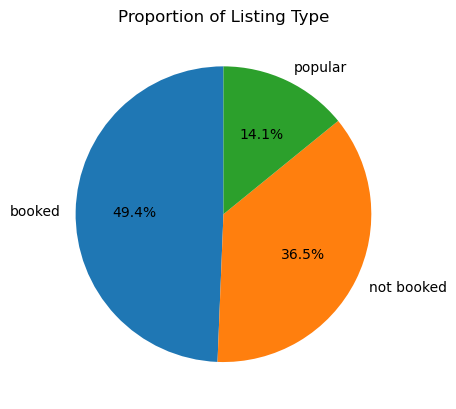

In [39]:
plt.pie(x=df_temp["count"],
        autopct="%.1f%%",
        labels=df_temp["type"],
        startangle=90)

plt.title("Proportion of Listing Type")
plt.show()

Insight:
- Approximately 50% of the listings are being booked regularly. 
- 36.5% of the listings have not been booked at all.
- Only 14% of the listings can be considered "popular", indicating a small portion of listings receive high engagement.

We will compare and analyze these listing types across various aspects in later sections. For now, let us examine the distribution of listing types within the `recent` dataset to establish an initial overview.

In [40]:
print(f"{(len(df_recent)/len(df) * 100):.1f} % of the listings are being booked in the last 12 months")


41.9 % of the listings are being booked in the last 12 months


- The data suggests that locals are more likely to book well-reviewed listings, indicating a preference for trust and familiarity over trying new accommodations.

## Geographical analysis

In [41]:
def bangkok_city():
    bangkok = folium.Map(location= (13.736717, 100.523186),
                        tiles="CartoDB Positron")

    chor = folium.Choropleth(
        geo_data = r'Bangkok-districts.geojson',
        fill_opacity=0,
        line_weight=2,
        key_on = 'feature.properties.dname_e'
    )

    chor.add_to(bangkok)
    return bangkok

def neighbourhood_marker(df):
    neighbourhood_dict = {}
    for neighbourhood in df["neighbourhood"].unique():
        temp_df = df[["latitude","longitude"]][df["neighbourhood"] == neighbourhood]
        neighbourhood_dict[neighbourhood] = (len(temp_df), temp_df["latitude"].mean(), temp_df["longitude"].mean())

    return neighbourhood_dict

Let's begin by identifying which neighbourhoods have the highest number of listings and which receive the most reviews. This will provide insight into both supply concentration and areas of high demand within Bangkok.

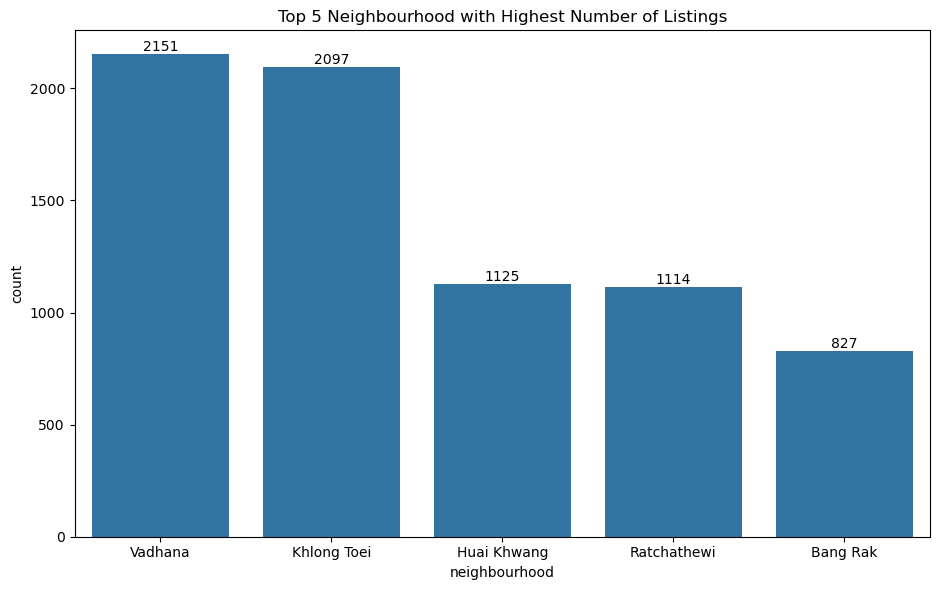

In [42]:
fig, ax = plt.subplots(figsize=(10, 6))
x = sns.countplot(data =df,
              x="neighbourhood",
              order=df["neighbourhood"].value_counts().iloc[:5].index,
              ax=ax)

for label in x.containers:
    x.bar_label(label)

plt.title("Top 5 Neighbourhood with Highest Number of Listings")
plt.tight_layout(rect=[0, 0, 0.95, 1])

The number of listings in Vadhana appears to be similar to that in Khlong Toei. To determine whether this difference is statistically significant, we can perform 2 sample Z-test proportion test.

In [43]:
from statsmodels.stats.proportion import proportions_ztest
count = [df["neighbourhood"].value_counts().iloc[0],df["neighbourhood"].value_counts().iloc[1]]
nobs = len(df)
stat, p_value = proportions_ztest(count, nobs)

# result
if p_value < 0.05:
    print("There is no significant difference in the number of listing between Vadhana and Khlong Toei")
else:
    print("There is a significant difference in the number of listing between Vadhana and Khlong Toei")

There is a significant difference in the number of listing between Vadhana and Khlong Toei


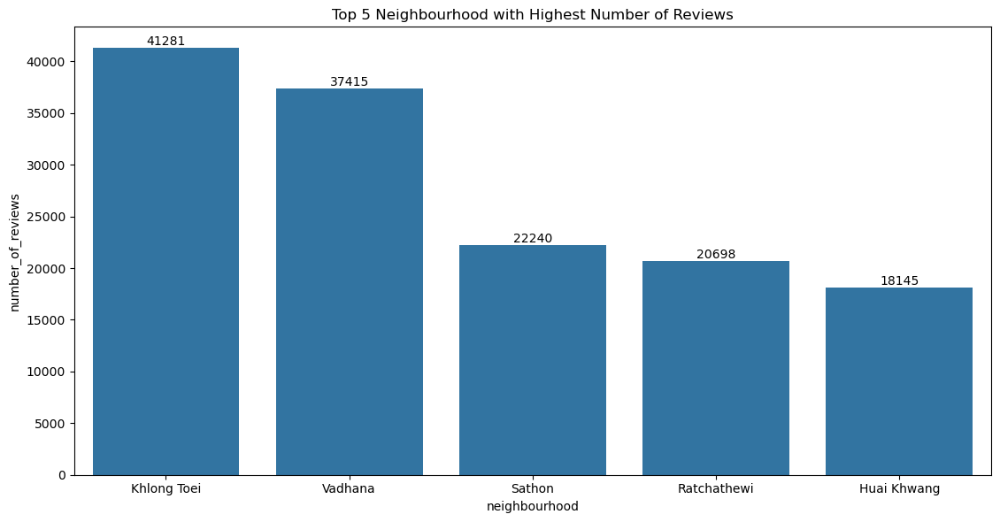

In [44]:
order = df.groupby("neighbourhood").sum("number_of_reviews")["number_of_reviews"].sort_values(ascending=False).iloc[:5].index
fig, ax = plt.subplots(figsize=(12, 6))
x = sns.barplot(data =df,
              x = "neighbourhood",
              y = "number_of_reviews",
              estimator="sum",
              order = order,
              ax=ax,
              errorbar=("ci",False))

for label in x.containers:
    x.bar_label(label)

plt.title("Top 5 Neighbourhood with Highest Number of Reviews")
plt.tight_layout(rect=[0, 0, 0.95, 1])

Insights:
- Vadhana has the highest number of available listings, closely followed by Khlong Toei.
- In terms of demand, Khlong Toei is the most frequently booked neighbourhood, with Vadhana ranking second.

Since Vadhana has a larger number of listings but relatively lower demand, hosts may be compelled to lower their prices in order to remain competitive. Conversely, in Khlong Toei, where demand is higher and supply is more limited, the average listing price may increase due to stronger competition among guests. This supply–demand dynamic can lead to price suppression in Vadhana and price inflation in Khlong Toei.

### Not Booked Dataset

In [45]:
bangkok = bangkok_city()
nd = neighbourhood_marker(df[df["type"] == "not booked"])
colormap = cm.linear.YlOrRd_09.scale(df[df["type"] == "not booked"]["neighbourhood"].value_counts().min(),
                                     df[df["type"] == "not booked"]["neighbourhood"].value_counts().max())
for key ,value in nd.items():
    folium.Circle([value[1],value[2]],
                  tooltip=f"{key} : {value[0]} lisitngs",
                  radius=500,
                  fill = True,
                  fill_opacity = 0.8,
                  weight = 0.3,
                  fill_color=colormap(value[0])).add_to(bangkok)
colormap.add_to(bangkok)
bangkok

Insight:
- Vadhana has the highest number of unbooked listings, with a total of 753 listings.
- Additionally, there are several unbooked listings located in the outskirts of Bangkok, which may be less attractive to guests due to longer travel time to major attraction sites.

### Normal Booking Dataset

In [46]:
bangkok = bangkok_city()
df_dict = neighbourhood_marker(df[df["type"] == "booked"])
colormap = cm.linear.YlOrRd_09.scale(df[df["type"] == "booked"]["neighbourhood"].value_counts().min(), 
                                     df[df["type"] == "booked"]["neighbourhood"].value_counts().max())

for keys, values in df_dict.items():
    folium.Circle([values[1],values[2]],
                    radius = 500,
                    tooltip = f"{keys} : {values[0]} listings",
                    fill = True,
                    fill_opacity = 0.8,
                    weight = 0.3,
                    fill_color=colormap(values[0])).add_to(bangkok)

colormap.caption = 'Number of listings'
colormap.add_to(bangkok)
bangkok

Insight
- Areas near the city center are highly preferred, with Khlong Toei being the most densely booked region, followed closely by Vadhana.
- Although some listings in the outskirts of Bangkok are being booked, the number of bookings in these areas is significantly lower, indicating a strong preference for central locations.

### Popular Dataset

In [47]:
bangkok = bangkok_city()
df_dict = neighbourhood_marker(df[df["type"] == "popular"])
colormap = cm.linear.YlOrRd_09.scale(df[df["type"] == "popular"]["neighbourhood"].value_counts().min(),
                                     df[df["type"] == "popular"]["neighbourhood"].value_counts().max())

for keys, values in df_dict.items():
    folium.Circle([values[1],values[2]],
                    radius = 500,
                    tooltip = f"{keys} : {values[0]} listings",
                    fill = True,
                    fill_opacity = 0.8,
                    weight = 0.3,
                    fill_color=colormap(values[0])).add_to(bangkok)

colormap.caption = 'Number of listings'
colormap.add_to(bangkok)
bangkok

insight:
- There are no popular listings located in the outskirts of Bangkok, all high-demand listings are concentrated in central areas.
- The farther a listing is from the city center, the less likely it is to be ppopular.

### Recent Dataset

In [48]:
bangkok = bangkok_city()
df_dict = neighbourhood_marker(df_recent)
colormap = cm.linear.YlOrRd_09.scale(df_recent["neighbourhood"].value_counts().min(),
                                     df_recent["neighbourhood"].value_counts().max())

for keys, values in df_dict.items():
    folium.Circle([values[1],values[2]],
                    radius = 500,
                    tooltip = f"{keys} : {values[0]} listings",
                    fill = True,
                    fill_opacity = 0.8,
                    weight = 0.3,
                    fill_color=colormap(values[0])).add_to(bangkok)

colormap.caption = 'Number of listings'
colormap.add_to(bangkok)
bangkok

Insight:
- Khlong Toei consistently remains the most in-demand neighborhood, followed closely by Vadhana.
- confirm that the city center is the most preferred location.
- There is no shift in location preference in the recent time.
- Listings located in the outskirts keep show minimal to no signs of popularity.

Overall conclusions:
- Vadhana has the highest number of available Airbnb listings and Khlong Toei closely follows in terms of listing volume.
- Khlong Toei has the highest booking activity and review count, while Vadhana ranks second in demand.
- Listings in city center regions are more likely to be reviewed, categorized as "popular," and repeatedly booked.
- Outskirts of Bangkok have a significantly higher proportion of unbooked listings, indicating lower guest interest.
- Booking patterns are consistent over time, with no significant trend shift toward outer districts.
- Location to the city center and points of interest is a major factor in guest preference.

## Room Type Data

In [49]:
df_temp = df["room_type"].value_counts().reset_index()
df_temp

,room_type,count
0,Entire home/apt,8907
1,Private room,5767
2,Hotel room,648
3,Shared room,523


Text(0.0, 1.0, 'Proportion of Room Type')

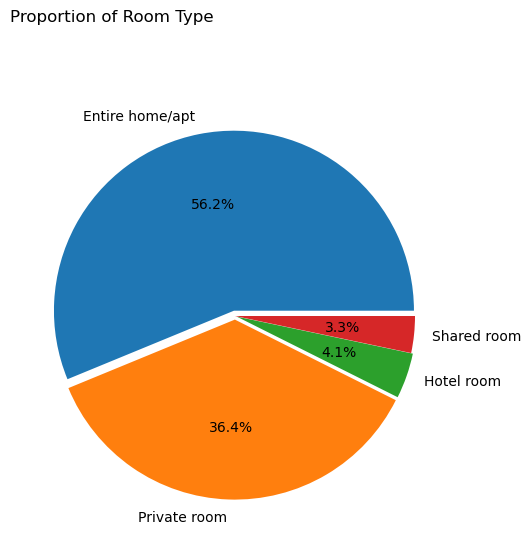

In [50]:
plt.pie(x=df_temp["count"],
        autopct="%.1f%%",
        labels=df_temp["room_type"],
        startangle=0,
        explode=(0.03,0.02,0.01,0))
plt.tight_layout()
plt.title("Proportion of Room Type",loc="left",pad=50)

Insight:
- Entire home/apt is the most common room type, making up 56.2% of all listings.
- Private room is the second most available type, accounting for 36.4%.
- Shared room and Hotel room represent only a small portion of the listings.

### Recent Dataset

In [51]:
colors = sns.color_palette("Set2")

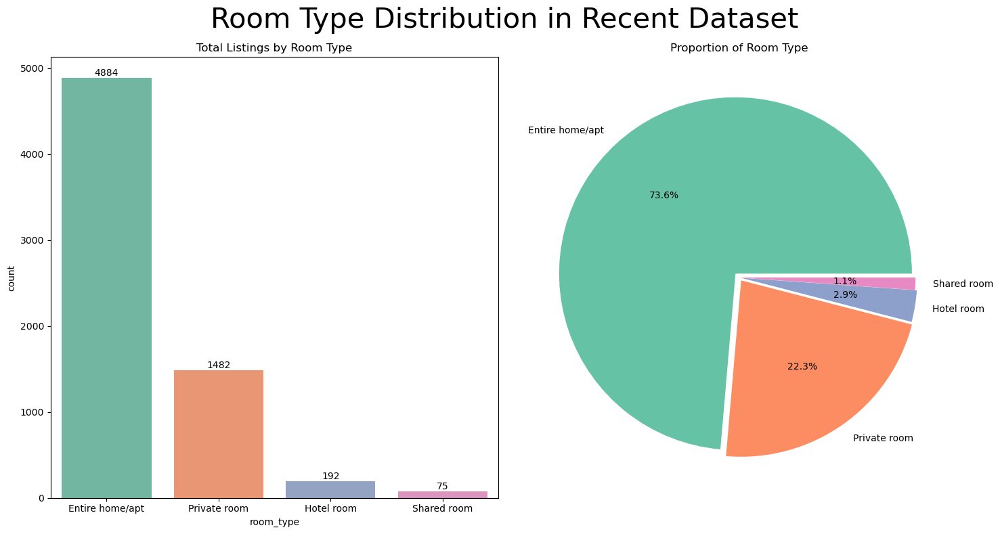

In [52]:
df_temp = df_recent["room_type"].value_counts().reset_index()

fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,8))
x = sns.barplot(data=df_temp,
            x="room_type",
            y="count",
            palette=colors,
            ax=ax1)
for label in x.containers:
    x.bar_label(label)
ax1.set_title("Total Listings by Room Type")

ax2.pie(x=df_temp["count"],
        autopct="%.1f%%",
        labels=df_temp["room_type"],
        startangle=0,
        explode=(0.03,0.02,0.01,0),
        colors=colors)

ax2.set_title("Proportion of Room Type")

plt.suptitle("Room Type Distribution in Recent Dataset", fontsize = 30)
plt.tight_layout()

Insight:
- Entire homes/apartments are the most preferred room type in recent year.
- Local guests tend to favor private lodging over shared spaces.

### Comparison of Booking Categories Across Room Types

In [53]:
df_temp = pd.crosstab(df["room_type"],
                      df["type"]).T
df_temp

room_type,Entire home/apt,Hotel room,Private room,Shared room
type,,,,
booked,4805,363,2471,182
not booked,2342,198,2927,318
popular,1760,87,369,23


#### Entire Home/Apt

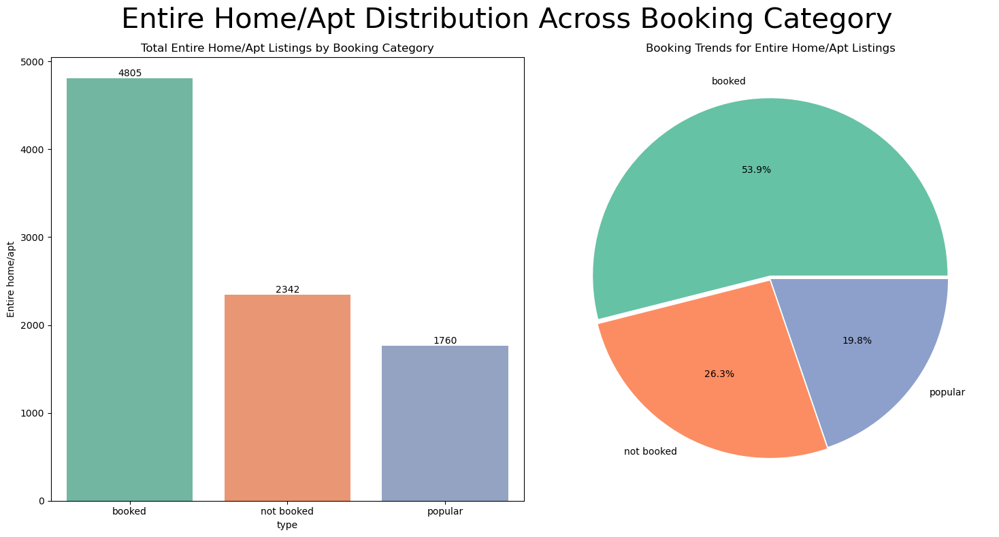

In [54]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,8))
x = sns.barplot(data=df_temp,
              x="type",
              y = "Entire home/apt",
              ax=ax1,
              palette=colors)
for label in x.containers:
    x.bar_label(label)
ax1.set_title("Total Entire Home/Apt Listings by Booking Category")

ax2.pie(x=df_temp["Entire home/apt"],
        autopct="%.1f%%",
        labels=df_temp.reset_index()["type"],
        startangle=0,
        explode=(0.02,0.01,0),
        colors=colors)
ax2.set_title("Booking Trends for Entire Home/Apt Listings")

plt.suptitle("Entire Home/Apt Distribution Across Booking Category", fontsize = 30)
plt.tight_layout()

Insight:
- 53.9% of Entire Home/Apt listings are regularly booked.
- 20% of these listings are categorized as popular.
- The majority of Entire Home/Apt listings are actively booked.
- Local consumers prefer private, fully available accommodations.

#### Hotel Room

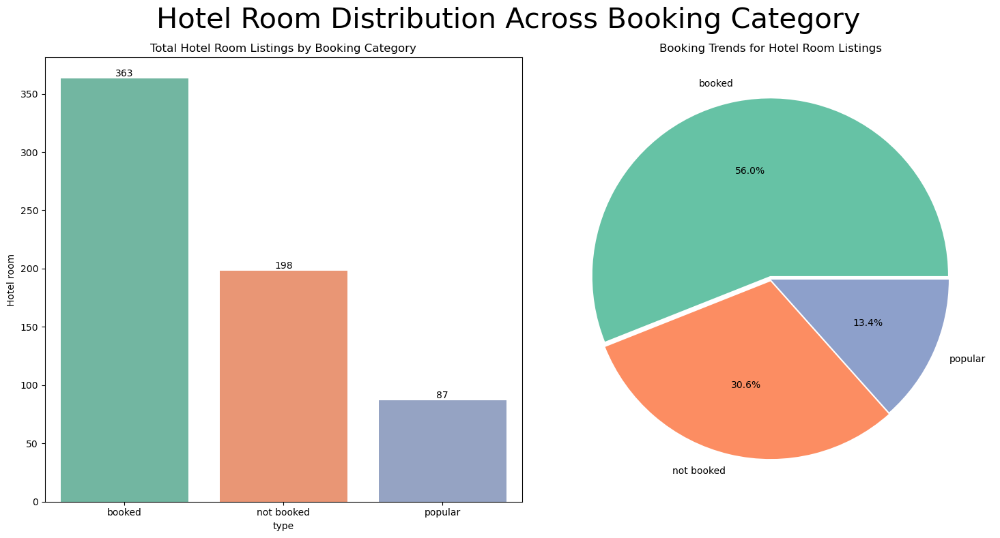

In [55]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,8))
x = sns.barplot(data=df_temp,
              x="type",
              y = "Hotel room",
              ax=ax1,
              palette=colors)
for label in x.containers:
    x.bar_label(label)
ax1.set_title("Total Hotel Room Listings by Booking Category")

ax2.pie(x=df_temp["Hotel room"],
        autopct="%.1f%%",
        labels=df_temp.reset_index()["type"],
        startangle=0,
        explode=(0.02,0.01,0),
        colors=colors)

ax2.set_title("Booking Trends for Hotel Room Listings")
plt.suptitle("Hotel Room Distribution Across Booking Category", fontsize = 30)
plt.tight_layout()

Insight:
- A significant portion of hotel room listings continue to receive bookings.
- Hotel room listings have a relatively low popularity rate, with only 13.4% classified as popular.

#### Shared Room

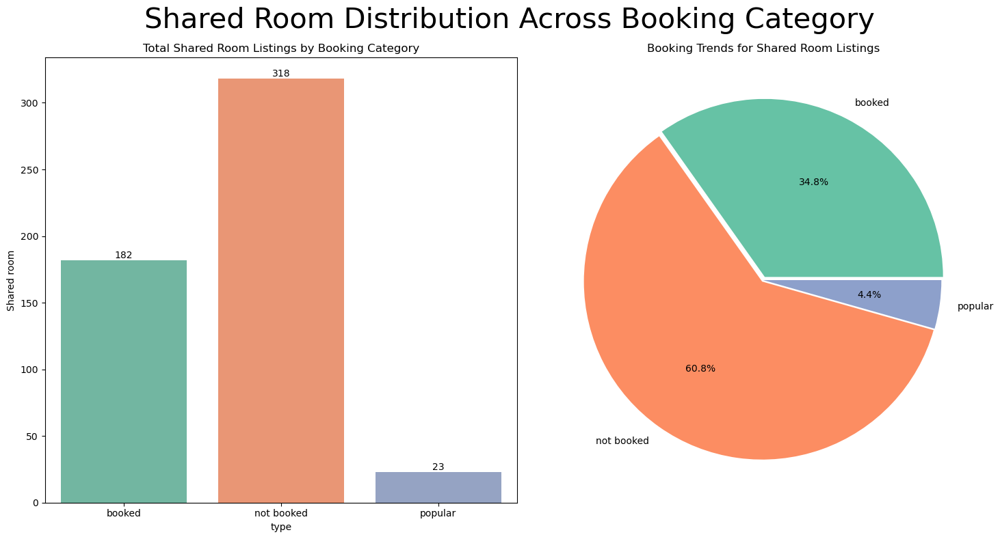

In [56]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,8))
x = sns.barplot(data=df_temp,
              x="type",
              y = "Shared room",
              ax=ax1,
              palette=colors)
for label in x.containers:
    x.bar_label(label)
ax1.set_title("Total Shared Room Listings by Booking Category")

ax2.pie(x=df_temp["Shared room"],
        autopct="%.1f%%",
        labels=df_temp.reset_index()["type"],
        startangle=0,
        explode=(0.02,0.01,0),
        colors=colors)
ax2.set_title("Booking Trends for Shared Room Listings")
plt.suptitle("Shared Room Distribution Across Booking Category", fontsize = 30)
plt.tight_layout()


Insight:
- A significant portion of listings remain unbooked.
- Shared room accommodations are generally unpopular among locals.
- Only 4.4% of listings are considered popular, further indicating that shared rooms are poorly received by locals.

#### Private Room

Text(0.5, 1.0, 'proportion of room type')

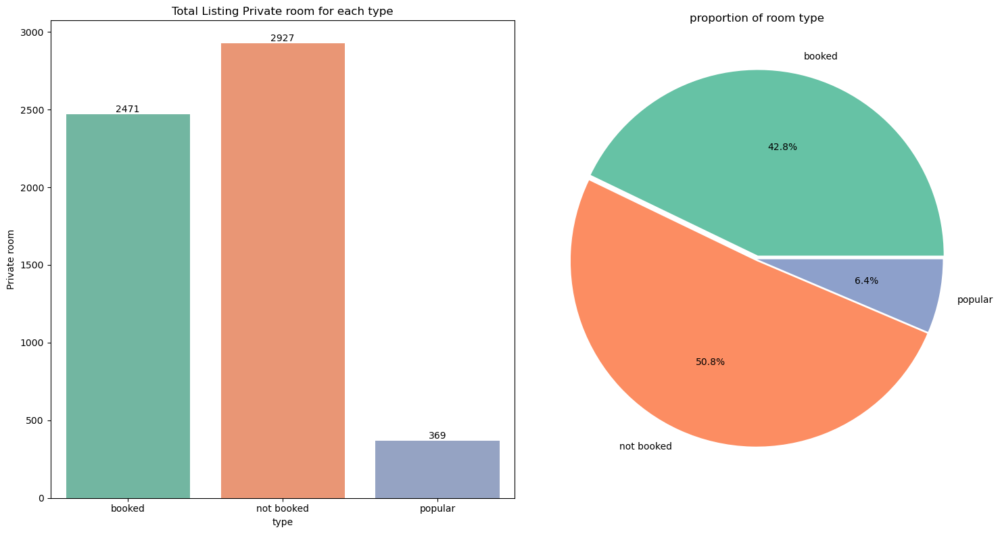

In [57]:
fig, (ax1,ax2) = plt.subplots(ncols=2,figsize=(15,8))
x = sns.barplot(data=df_temp,
              x="type",
              y = "Private room",
              ax=ax1,
              palette=colors)
for label in x.containers:
    x.bar_label(label)
ax1.set_title("Total Listing Private room for each type")

ax2.pie(x=df_temp["Private room"],
        autopct="%.1f%%",
        labels=df_temp.reset_index()["type"],
        startangle=0,
        explode=(0.02,0.01,0),
        colors=colors)
plt.tight_layout()
ax2.set_title("proportion of room type")

Insight:
- Half of the available listings have not been booked, indicating low demand.
- Private rooms are also unpopular among locals.

# Price

Before proceeding with further analysis, it's important to check whether the distribution of prices is normal. We'll start by visualizing the price distribution for each room type using histograms.

In [58]:
df_not_booked_eh = df[(df["room_type"]== "Entire home/apt") & (df["type"]=="not booked")]["price"]
df_not_booked_hr = df[(df["room_type"]== "Hotel room") & (df["type"]=="not booked")]["price"]
df_not_booked_sr = df[(df["room_type"]== "Shared room") & (df["type"]=="not booked")]["price"]
df_not_booked_pr = df[(df["room_type"]== "Private room") & (df["type"]=="not booked")]["price"]

<Axes: >

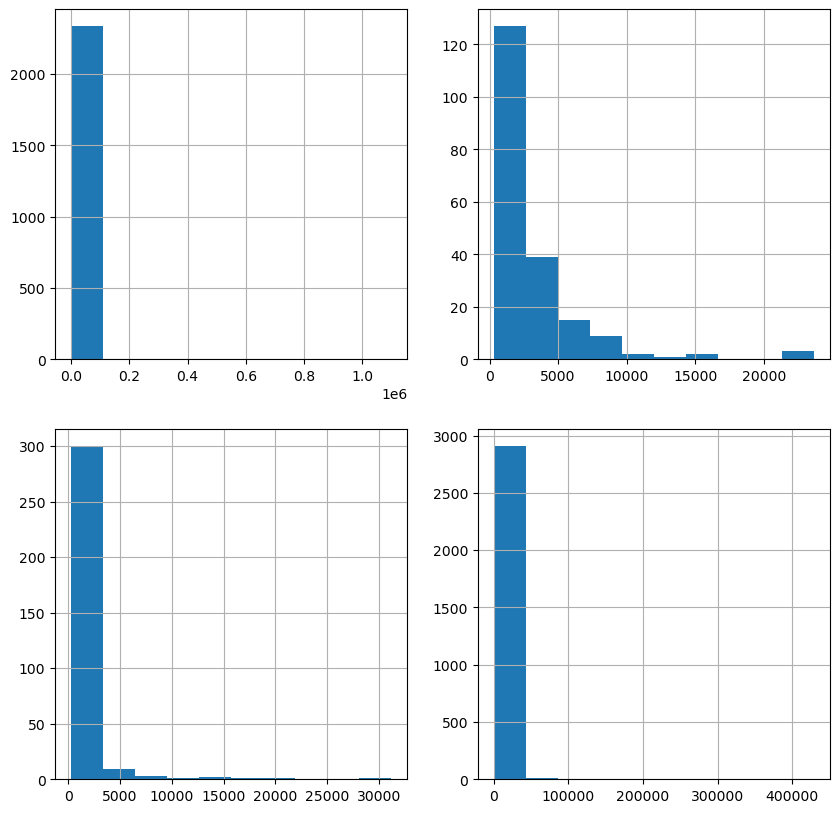

In [59]:
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(10,10))
df_not_booked_eh.hist(ax=ax[0,0])
df_not_booked_hr.hist(ax=ax[0,1])
df_not_booked_sr.hist(ax=ax[1,0])
df_not_booked_pr.hist(ax=ax[1,1])

The histograms show that price distributions for all room types are skewed and do not follow a normal distribution. Therefore, we will use the median as the aggregate measure instead of the mean.

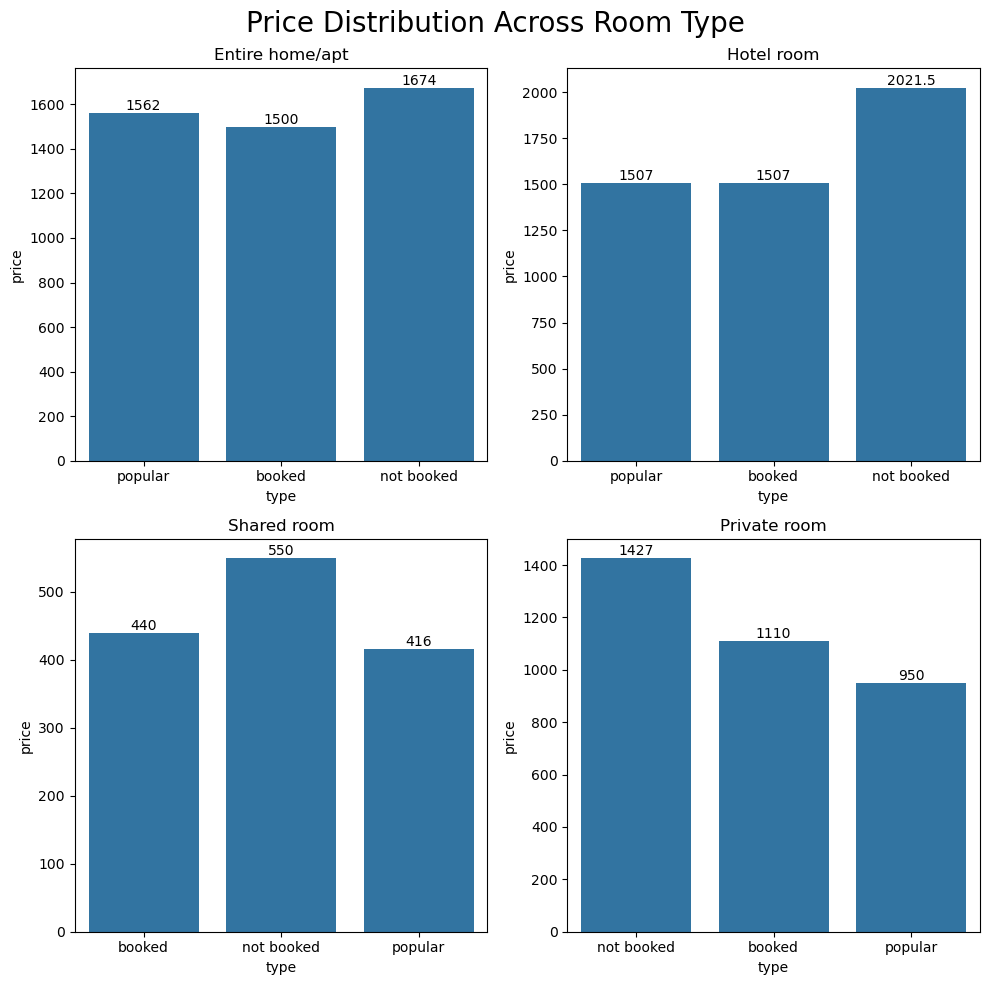

In [60]:
fig, ax = plt.subplots(ncols=2,nrows=2,figsize=(10,10))
x = sns.barplot(data=df[df["room_type"]== "Entire home/apt"],
            x="type",
            y="price",
            estimator="median",
            errorbar=("ci",False),
            ax=ax[0,0])

for label in x.containers:
    x.bar_label(label)
ax[0,0].set_title("Entire home/apt")


x = sns.barplot(data=df[df["room_type"]== "Hotel room"],
            x="type",
            y="price",
            estimator="median",
            errorbar=("ci",False),
            ax=ax[0,1])

for label in x.containers:
    x.bar_label(label)
ax[0,1].set_title("Hotel room")

x = sns.barplot(data=df[df["room_type"]== "Shared room"],
        x="type",
        y="price",
        estimator="median",
        errorbar=("ci",False),
        ax=ax[1,0])

for label in x.containers:
    x.bar_label(label)
ax[1,0].set_title("Shared room")

x = sns.barplot(data=df[df["room_type"]== "Private room"],
            x="type",
            y="price",
            estimator="median",
            errorbar=("ci",False),
            ax=ax[1,1])

for label in x.containers:
    x.bar_label(label)

ax[1,1].set_title("Private room")

plt.suptitle("Price Distribution Across Room Type", fontsize = 20)
plt.tight_layout()

Since some of the median prices appear similar, we will conduct statistical tests to compare the median prices between popular and booked listings for the `Entire home/apt`, `Hotel room`, and `Shared room` categories.

Since the distribution of price is not normal, We will use `Mann-Whitney U` test.

In [61]:
from scipy.stats import mannwhitneyu
entire_home = df[df["room_type"] == "Entire home/apt"]
hotel_room = df[df["room_type"] == "Hotel room"]
shared_room = df[df["room_type"] == "Shared room"]

In [62]:
# entire_home
stats, pvalue = mannwhitneyu(entire_home[entire_home["type"]=="booked"]["price"],
                             entire_home[entire_home["type"]=="popular"]["price"])

# result
if p_value < 0.05:
    print("There is no significant difference in distribution of price between popular and booked listings for the 'Entire home/apt' category")
else:
    print("There is significant difference in distribution of price between popular and booked listings for the 'Entire home/apt' category")

There is significant difference in distribution of price between popular and booked listings for the 'Entire home/apt' category


In [63]:
# hotel_room
stats, pvalue = mannwhitneyu(hotel_room[hotel_room["type"]=="booked"]["price"],
                             hotel_room[hotel_room["type"]=="popular"]["price"])

# result
if p_value < 0.05:
    print("There is no significant difference in distribution of price between popular and booked listings for the 'Hotel room' category")
else:
    print("There is significant difference in distribution of price between popular and booked listings for the 'Hotel room' category")

There is significant difference in distribution of price between popular and booked listings for the 'Hotel room' category


In [64]:
# shared_room
stats, pvalue = mannwhitneyu(shared_room[shared_room["type"]=="booked"]["price"],
                             shared_room[shared_room["type"]=="popular"]["price"])

# result
if p_value < 0.05:
    print("There is no significant difference in distribution of price between popular and booked listings for the 'Shared room' category")
else:
    print("There is significant difference in distribution of price between popular and booked listings for the 'Shared room' category")

There is significant difference in distribution of price between popular and booked listings for the 'Shared room' category


Although the median prices are similar, the Mann–Whitney U test yielded a p-value below 0.05 for all three room types, indicating a statistically significant difference in the distribution of prices between popular and booked listings.

Insight:
- Listings that are being booked tend to be priced lower than those that remain unbooked.
- To reach the popular category, pricing strategies vary by room type — for example, private rooms generally need to lower their prices further, while Entire home/apartment listings can charge higher prices and still attract popularity.

Text(0.5, 1.0, 'Median Price of Recently Booked Listings by Room Type')

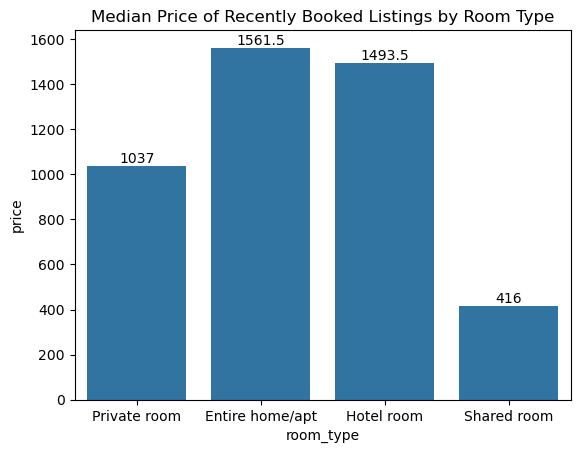

In [65]:
x = sns.barplot(df_recent,
                x="room_type",
                y="price",
                errorbar=("ci",False),
                estimator="median")
for label in x.containers:
    x.bar_label(label)

plt.title("Median Price of Recently Booked Listings by Room Type")

Insight:
- Entire home/apartment listings have the highest median price, with hotel rooms coming in as the second most expensive category.

## Minimum night

In [66]:
df_not_booked = df[df["type"]== "not booked"]
df_booked = df[df["type"]== "booked"]
df_popular = df[df["type"]== "popular"]

In [67]:
not_booked = df_not_booked["stay_category"].value_counts().reset_index()
booked = df_booked["stay_category"].value_counts().reset_index()
popular = df_popular["stay_category"].value_counts().reset_index()
recent = df_recent["stay_category"].value_counts().reset_index()

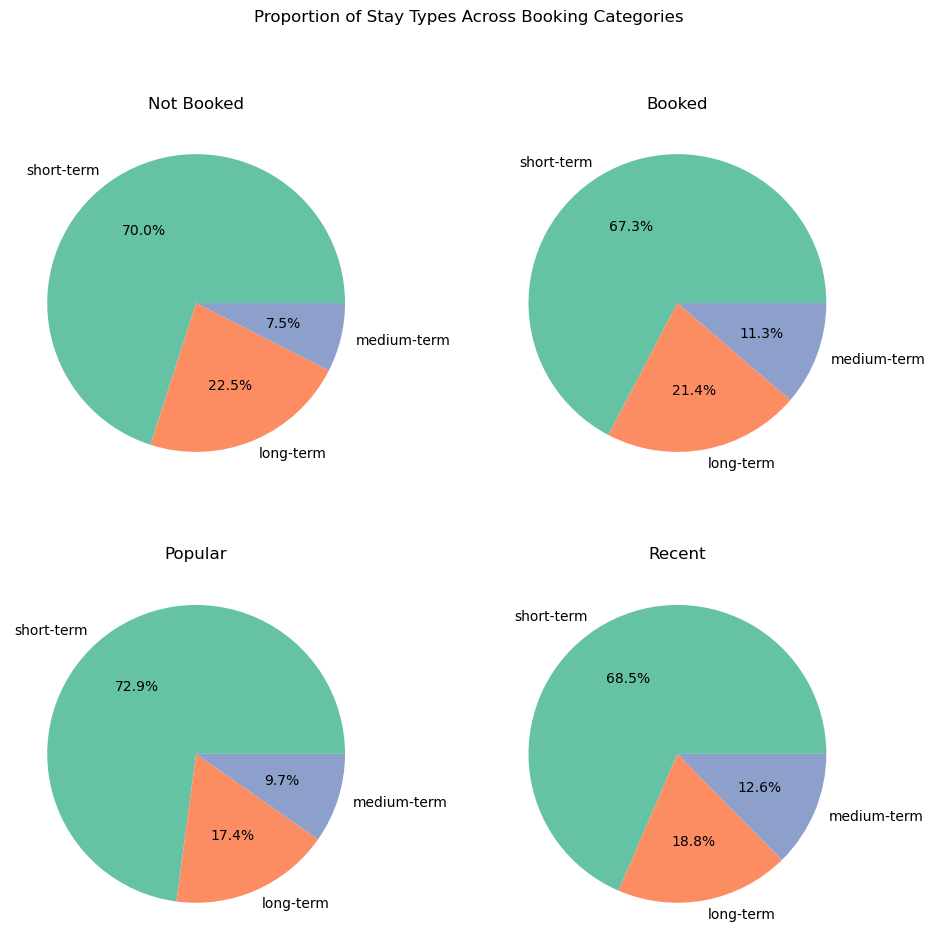

In [68]:
figure, ax = plt.subplots(ncols=2,nrows=2,figsize = (10,10))

ax[0,0].pie(not_booked["count"],
        colors=colors,
        autopct="%.1f%%",
        labels=not_booked["stay_category"])
ax[0,0].set_title("Not Booked")

ax[0,1].pie(booked["count"],
        colors=colors,
        autopct="%.1f%%",
        labels=booked["stay_category"])
ax[0,1].set_title("Booked")

ax[1,0].pie(popular["count"],
        colors=colors,
        autopct="%.1f%%",
        labels=popular["stay_category"])
ax[1,0].set_title("Popular")

ax[1,1].pie(recent["count"],
        colors=colors,
        autopct="%.1f%%",
        labels=recent["stay_category"])
ax[1,1].set_title("Recent")

plt.suptitle("Proportion of Stay Types Across Booking Categories")
plt.tight_layout(pad=3)

Insight:
- Short-term listings are dominant and most likely to get booked or become popular.
- Medium-term stays show a mild upward trend in bookings.
- Long-term listings are relatively stable but less favored in popular and recent bookings.

# Conclusion


- Geographical Distribution

    
    Neighborhoods like Ratchathewi, Vadhana, and Khlong Toei stand out with a higher density of listings, favored by local consumers for their closeness to attractions, transport hubs, and amenities.


- Room Type Preferences

    Local consumers show a strong preference for private rooms and entire homes/apartments, suggesting these should be the focus for future listings.



- Pricing Patterns

    Listings priced between 800 and 1905 per night are most likely to be booked, with prices varying by room type.



- Minimum Length of Stay

    Short-term stays (1-7 nights) are the most common, though medium-term stays (8-30 nights) are gaining traction and could be a growth opportunity.



- Recent Consumer Behavior

    Booking trends from the past year reinforce preferences for short-term stays in popular neighborhoods, with these listings being the most booked.

# Recommendations

Based on the insights gained from this analysis, we recommend the following strategies to enhance Airbnb's presence and effectiveness in the Bangkok market:

- Leverage Popular Locations: 

    Focus marketing efforts on promoting listings in high-demand neighborhoods such as Ratchathewi, Vadhana, and Khlong Toei. This could include targeted advertising campaigns and partnerships with local tourism boards or businesses to highlight the appeal of these areas.


- Optimize Room Type Offerings: 

    Encourage hosts to provide more hotel rooms and entire homes/apartments, as these are in high demand among local consumers. Airbnb could offer incentives or educational resources to assist hosts in converting or listing these property types.

- Implement Dynamic Pricing Strategies: 

    Utilize the pricing insights to help hosts set competitive rates within the optimal range of 800 to 1905 per night, tailored to specific room types and locations. Airbnb could develop pricing tools or algorithms to guide hosts in maximizing booking potential.



- Promote Short-Term Stays: 

    Given the dominance of short-term bookings, prioritize the visibility and promotion of listings that provide stays of 1-7 nights. This could involve featuring these listings more prominently on the platform or offering special deals for short-term travelers.

By adopting these recommendations, Airbnb can better align its services with the preferences of local consumers in Bangkok, thereby increasing booking rates, enhancing customer satisfaction, and ultimately strengthening its market position in the region.